#### 
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Exploring User Image Analysis: Unveiling Insights from Visual Data
</h4>

This comprehensive approach utilizes various techniques such as image recognition, data sampling, transfer learning with pre-trained models, and data visualization to uncover hidden patterns, trends, and crucial information residing within user images. By harnessing the power of image-based insights, this analysis enables data analysts to enhance data exploration, decision-making, and gain a deeper understanding of user behavior, preferences, and sentiments through their visual content.

**Given the resource-intensive nature of working with images**, it is prudent to take a sample of 1000 images for analysis and further processing. By sampling a smaller subset, we can mitigate the demands on memory, time, and computational resources, allowing us to efficiently explore and develop insights from the data. This approach facilitates initial experimentation and helps streamline the development of various applications related to the images.

In [42]:
import pandas as pd
import numpy as np


sample_size = 1000  # You can adjust the sample size based on your available resources
df_sampled = df_reviews.sample(n=sample_size, random_state=42)
df_sampled.reset_index(drop=True, inplace = True)
# Now you can work with the 'df_sampled' DataFrame, which contains a smaller subset of user images data

In [43]:
df_sampled

,review_id,user_name,user_image,review,score,thumbs_up_count,date,reply_content,replied_date,app_version,app_name
0,7b60ef05-0b34-4c5c-8116-dae15837cd50,Azeem Azhari,https://play-lh.googleusercontent.com/a/AAcHTt...,I have not received my AI,5,0,2023-07-19 17:57:37,NaN,NaT,NaN,Snapchat
1,a014a433-9e15-4f51-b4b1-d49e035ca53d,MD DAYAL Sk,https://play-lh.googleusercontent.com/a/AAcHTt...,Nd DAYAL Sk,5,0,2021-08-07 12:41:44,NaN,NaT,NaN,Skype
2,46ccf07f-cda3-4c0d-99fd-ef4aa37481dd,Jerome Agliam,https://play-lh.googleusercontent.com/a-/AD_cM...,Calls don't drop and audio is very clear. Good...,5,0,2021-05-25 22:02:11,NaN,NaT,8.68.0.97,Skype
3,bff13ebf-a4ef-4e59-baaf-2d255187c72f,- AGATHA,https://play-lh.googleusercontent.com/a-/AD_cM...,مزور تاريخ,1,0,2023-04-15 14:02:48,NaN,NaT,NaN,Netflix
4,515033a6-1f90-47c5-a908-420264964363,Hadi Khan,https://play-lh.googleusercontent.com/a-/AD_cM...,Please unblock my num,1,0,2023-07-27 15:12:59,NaN,NaT,2.23.14.79,WhatsApp Messenger
...,...,...,...,...,...,...,...,...,...,...,...
995,46729758-ae5b-4181-ac16-fa90db9eaf63,Anuwar abdurehman mumed Anu,https://play-lh.googleusercontent.com/a/AAcHTt...,Good app,2,0,2023-07-10 12:03:19,NaN,NaT,363.0.0.6.63,Facebook Lite
996,1829556b-44ca-4853-a6ee-649fba0b3435,Peace Usifo,https://play-lh.googleusercontent.com/a/AAcHTt...,good i enjoyed it so well,5,1,2023-05-02 18:40:59,NaN,NaT,NaN,Facebook Lite
997,8d3e1baf-0b48-48e1-b96f-b95319fc3e94,Kimi no Htoo,https://play-lh.googleusercontent.com/a-/AD_cM...,I can't use messenger notes at all PLEASE FIX ...,1,0,2023-06-25 05:34:34,NaN,NaT,414.0.0.17.61,Messenger
998,643a77a7-1653-45cb-8c40-101956f9d388,Lauri Newblom,https://play-lh.googleusercontent.com/a/AAcHTt...,Easy to use!,5,0,2023-06-23 22:18:30,NaN,NaT,9.93.0-release.1,X


In [104]:
# let's save the sampled dataframe to use it in further analysis
df_sampled.to_csv("sampled_goolge_play_apps.csv", index = False )

##### 
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
User Image Grid Web Application using Falsk and Dash
    <h4/>

This code below creates a web application using Dash and Flask to display a grid of user images fetched from URLs. The user can select a range of images from a dropdown menu, and the corresponding grid image will be generated and displayed. The grid image is a collage of 100 user images, with 10 rows and 10 columns.

In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import dash
from dash import dcc, html, Input, Output
from dash.exceptions import PreventUpdate
from flask import Flask, send_file

# Sample DataFrame with 'user_image' column containing image URLs
# df_sampled = pd.DataFrame({'user_image': ['url1', 'url2', 'url3', ...]})  # Replace with your DataFrame

# Create Dash app
app = dash.Dash(__name__)

# Create Flask app (required to serve the images)
server = app.server

# Function to fetch images from URLs
def fetch_image(url):
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        return img
    except:
        return None

# Layout of the app
app.layout = html.Div([
    html.H1("User Image Grid"),
    dcc.Dropdown(
        id='image-range-dropdown',
        options=[
            {'label': f'{i+1} to {i+100}', 'value': i} for i in range(0, len(df_sampled), 100)
        ],
        value=0,
        style={'width': '50%'}
    ),
    html.Img(id='grid-image', style={'width': '80%', 'margin-top': '20px'})
])

# Define callback to update the grid image based on the selected range
@app.callback(
    Output('grid-image', 'src'),
    [Input('image-range-dropdown', 'value')]
)
def update_image_grid(selected_range):
    if selected_range is None:
        raise PreventUpdate

    # Get the subset of user images based on the selected range
    selected_images = df_sampled['user_image'].values[selected_range:selected_range+100]

    # Fetch the images from the URLs
    user_images = [fetch_image(url) for url in selected_images if fetch_image(url)]

    # Calculate the number of rows and columns in the grid
    rows = 10
    cols = 10

    # Create a new blank image to hold the grid
    grid_width = cols * 100  # Each image is 100x100 pixels
    grid_height = rows * 100
    grid_image = Image.new('RGB', (grid_width, grid_height), color='white')

    # Iterate through the images and paste each image into the grid
    for i, img in enumerate(user_images):
        img.thumbnail((100, 100))  # Resize the image to fit in a 100x100 box
        row = i // cols
        col = i % cols
        x_offset = col * 100
        y_offset = row * 100
        grid_image.paste(img, (x_offset, y_offset))

    # Save the grid image
    grid_image_path = f'user_image_grid_{selected_range+1}_to_{selected_range+100}.jpg'
    grid_image.save(grid_image_path)

    return f'/{grid_image_path}'


# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


**Important:** In case the interactive visualization isn't visible, you can refer to the images provided below. Please note that the current setup requires the code to be hosted on a server, a step that will be implemented in the future.

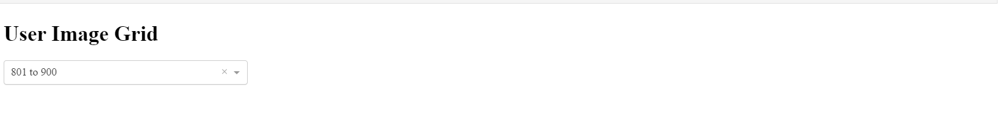
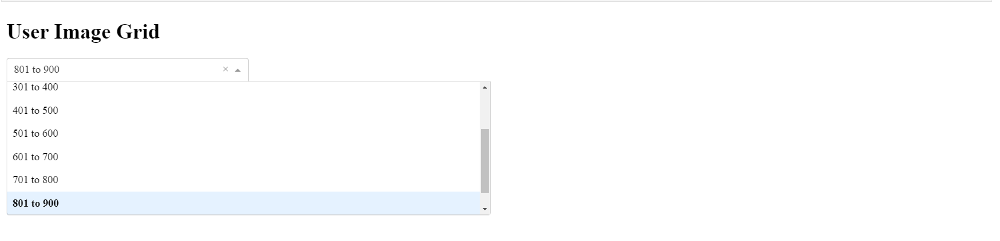
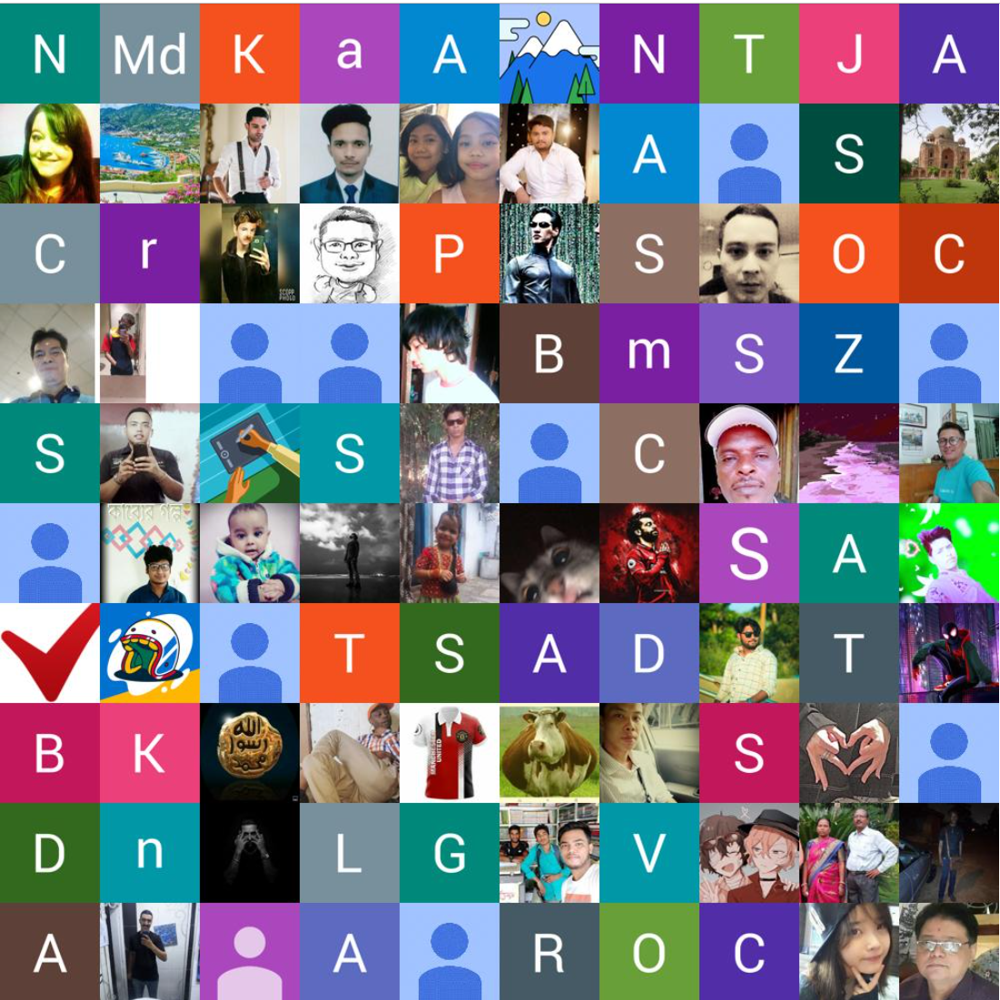
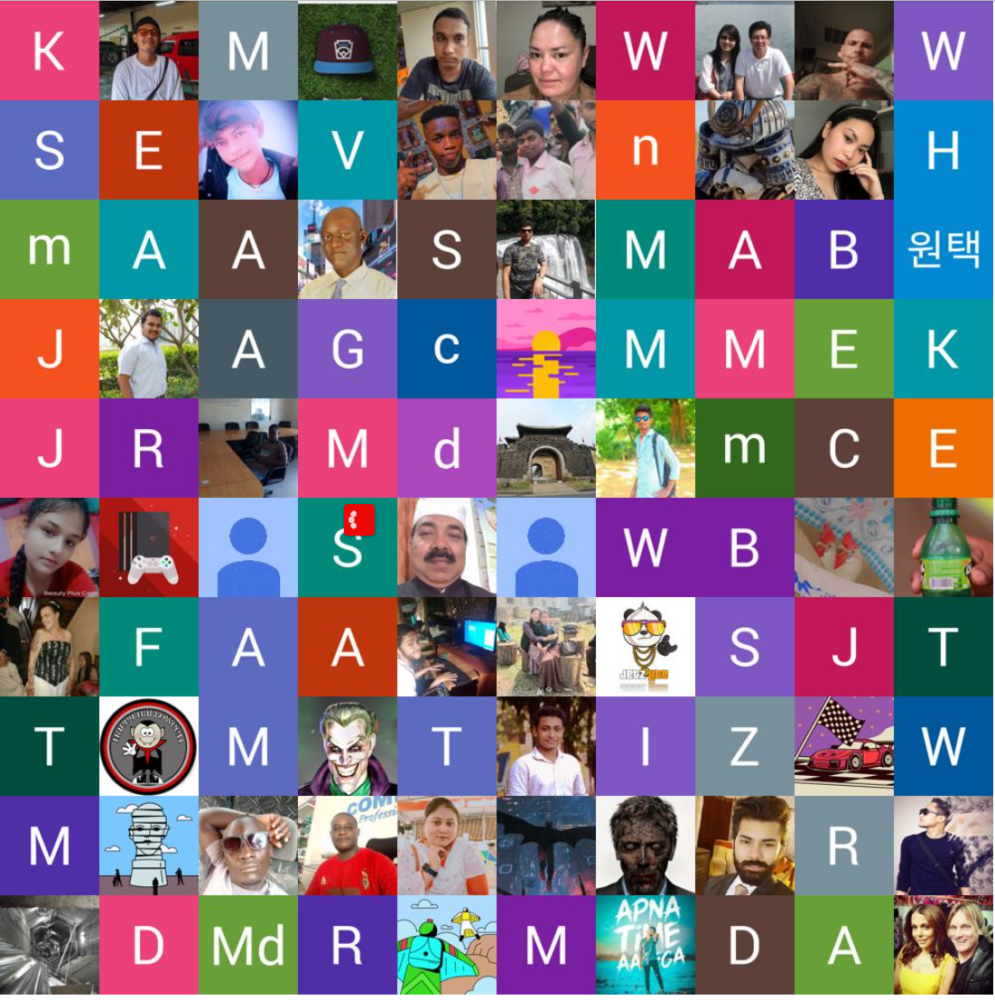

**Here's a breakdown of the code:**

1. The required libraries are imported, including `pandas` for working with data, `requests` for fetching images from URLs, `PIL` (Python Imaging Library) for image processing, `dash` and `flask` for creating the web application.

2. A sample DataFrame named `df_sampled` is assumed to be provided, containing a column named 'user_image' that contains image URLs.

3. The Dash app is created using `dash.Dash(__name__)`.

4. A Flask server instance is created using `app.server`, which is necessary to serve the images.

5. The `fetch_image` function is defined to fetch images from URLs and convert them to `PIL` images.

6. The layout of the Dash app is defined using `html.Div` and `dcc.Dropdown`. The user can select a range of images using the dropdown.

7. A callback function `update_image_grid` is defined to update the grid image based on the selected range. When the user selects a range, this function fetches the corresponding images, creates the grid image, and saves it in a file.

8. The Dash app is run using `app.run_server(debug=True)`.

9. When the user selects a range from the dropdown, the callback function is triggered, and it fetches the selected images, creates the grid image, saves it to a file, and returns the file path.

10. The grid image is displayed in the web app using an HTML `img` tag, and the `src` attribute is set to the file path returned by the callback.

Note: The `df_sampled` DataFrame with actual data should be provided to make this code work properly. The DataFrame should contain the 'user_image' column with image URLs.

##### 
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Image Classifier using TensorFlow</h4>

The code showcases the process of building an image classifier using TensorFlow and Keras. The classifier uses a pre-trained ResNet50 model as the backbone for feature extraction. This enables the model to learn powerful and discriminative features from a large dataset, making it efficient even with a limited amount of data.

In [ ]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Load the sampled DataFrame (df_sampled)
# Replace 'path_to_sampled_csv' with the actual path to your sampled CSV file
#df_sampled = pd.read_csv('path_to_sampled_csv')

# Function to fetch and preprocess the image from the URL
def fetch_and_preprocess_image(url):
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img = img.convert('RGB')  # Convert RGBA to RGB
        img = img.resize((224, 224))  # Resize the image to fit the ResNet50 model
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = preprocess_input(img)
        return img
    except:
        return None

# Load the ResNet50 model
model = ResNet50(weights='imagenet')

# Function to classify users based on their profile images
def classify_users(df):
    image_classes = []
    for url in df['user_image']:
        img = fetch_and_preprocess_image(url)
        if img is not None:
            # Get the original image shape
            original_shape = img.shape
            img = img.reshape((1, original_shape[0], original_shape[1], original_shape[2]))
            predictions = model.predict(img)
            decoded_predictions = decode_predictions(predictions, top=1)[0]
            image_class = decoded_predictions[0][1]
            image_classes.append(image_class)
        else:
            image_classes.append('Unknown')
    df['image_class'] = image_classes
    return df

# Perform user image analysis on the sampled DataFrame
df_sampled = classify_users(df_sampled)

# Print the DataFrame with the user image classifications
df_sampled[['user_name', 'user_image', 'image_class']]

##### 
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Batch Image Processing for Faster Dashboard Rendering
</h4>


- The provided code is a script that fetches images from URLs, processes them in batches of 100 images each, and saves the processed images as separate files. This approach is implemented to optimize the performance of the dashboard server, ensuring faster rendering of the images during visualization.

- By processing the images in batches and saving them as separate files, the script optimizes the rendering performance of the dashboard. The saved images can be efficiently loaded and displayed in the dashboard using Flask or any other web framework, ensuring a faster and more responsive user experience.

In [114]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO

# Function to fetch images from URLs
def fetch_image(url):
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        return img
    except:
        return None

# Assuming you have the 'user_image' column with image URLs in the DataFrame 'df_sampled'

# Create a list to store the images
user_images = []
for url in df_sampled['user_image'].values:
    img = fetch_image(url)
    if img:
        user_images.append(img)

# Process 100 images at a time and save them in separate files
batch_size = 100
num_batches = len(user_images) // batch_size

for batch_num in range(num_batches):
    start_idx = batch_num * batch_size
    end_idx = start_idx + batch_size
    batch_images = user_images[start_idx:end_idx]

    # Calculate the number of rows and columns in the grid
    rows = 10
    cols = 10

    # Create a new blank image to hold the grid
    grid_width = cols * 100  # Each image is 100x100 pixels
    grid_height = rows * 100
    grid_image = Image.new('RGB', (grid_width, grid_height), color='white')

    # Iterate through the images and paste each image into the grid
    for i, img in enumerate(batch_images):
        img.thumbnail((100, 100))  # Resize the image to fit in a 100x100 box
        row = i // cols
        col = i % cols
        x_offset = col * 100
        y_offset = row * 100
        grid_image.paste(img, (x_offset, y_offset))

    # Save the grid image
    grid_image.save(f'user_images/user_image_grid_batch_{batch_num}.jpg')

    # Optionally, you can also display the grid image
    # grid_image.show()

In [ ]:
import os
import dash
from dash import dcc, html, Input, Output
from flask import Flask, send_file

# Create Dash app
app = dash.Dash(__name__)

# Create Flask app (required to serve the images)
server = app.server

# Function to fetch grid images from the GitHub repository
def fetch_image_batch(batch_num):
    image_url = f"https://raw.githubusercontent.com/ZaidAlmelhem/Puplic_Files/main/user_imagess/user_image_grid_batch_{batch_num}.jpg"
    return image_url

# Assuming you have the total number of batches stored in 'num_batches'
num_batches = 10  # Replace with the total number of batches

# Layout of the app
app.layout = html.Div([
    html.H1("User Image Grid Viewer"),
    dcc.Dropdown(
        id='image-range-dropdown',
        options=[
            {'label': f'{i * 100} - {(i+1) * 100 - 1}', 'value': i} for i in range(num_batches)
        ],
        value=0,
        style={'width': '50%'}
    ),
    html.Img(id='grid-image', style={'width': '80%', 'margin-top': '20px'})
])

# Define callback to update the grid image based on the selected range
@app.callback(
    Output('grid-image', 'src'),
    [Input('image-range-dropdown', 'value')]
)
def update_image_grid(selected_range):
    if selected_range is None:
        return

    # Fetch the image from the GitHub repository based on the selected range
    image_url = fetch_image_batch(selected_range)

    return image_url


# Run the app
if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

**Important:** In case the interactive visualization isn't visible, you can refer to the images provided below. Please note that the current setup requires the code to be hosted on a server, a step that will be implemented in the future.

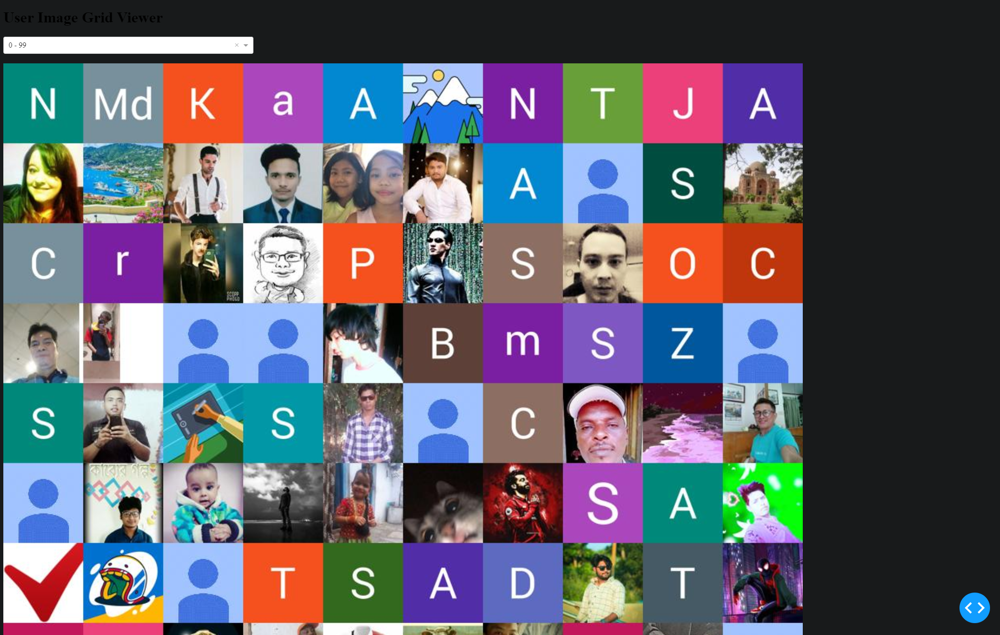
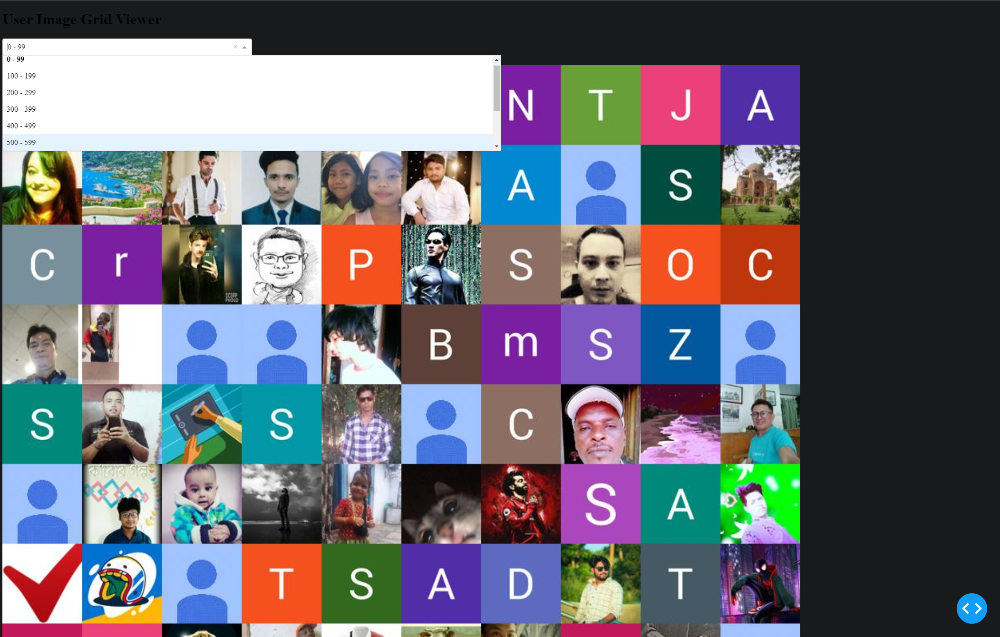

#### 

<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Distribution of Review Scores - Visualizing User Ratings 
</h4>

In this analysis, we present a histogram showcasing the distribution of review scores provided by users . The histogram allows us to understand how users rate the apps, providing valuable insights into the overall user satisfaction with the applications. The x-axis is represented with stars (★), where the number of stars corresponds to the review score given by users. This visually appealing representation helps us gain a quick understanding of the rating patterns and identify popular as well as less favored apps based on user feedback.

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have the DataFrame 'df_reviews' already loaded

# Create a histogram to visualize the distribution of review scores
fig = go.Figure()

# Define the ticktext and tickvals for the x-axis
tickvals = df_reviews['score'].value_counts().sort_index().index
ticktext = ['★' * int(score) for score in tickvals]

fig.add_trace(go.Histogram(
    x=df_reviews['score'],
    nbinsx=10,
    marker_color='#a4edb8'
))

fig.update_layout(
    title='Distribution of Review Scores',
    xaxis_title='Review Score',
    yaxis_title='Frequency',
    xaxis=dict(
        tickmode='array',
        tickvals=tickvals,
        ticktext=ticktext
    ),
    plot_bgcolor='#152737',
    paper_bgcolor='#152737',
    font=dict(color='#a4edb8'),
    height=600,
)

fig.show()

#### 
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Interactive Histogram of Review Scores for each App 
</h4>


his interactive data visualization presents a histogram of review scores for various mobile apps. The histogram allows users to explore how users rate different apps by selecting the desired app from the dropdown menu. Each bar in the histogram represents the frequency of review scores, which are depicted by stars (★) corresponding to one to five stars. By using this interactive plot, users can gain insights into the distribution of review ratings for specific mobile apps and identify patterns in user feedback.

In [ ]:
import pandas as pd
import plotly.express as px
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

# Assuming you have already loaded the dataset into df_reviews DataFrame

# Create a Dash app
app = dash.Dash(__name__)

# Define the layout of the app
app.layout = html.Div([
    html.H1("Distribution of Review Scores for Mobile Apps"),
    
    dcc.Dropdown(
        id='app-dropdown',
        options=[{'label': app_name, 'value': app_name} for app_name in df_reviews['app_name'].unique()],
        value=df_reviews['app_name'].unique()[0],
        style={'width': '50%'}
    ),
    
    dcc.Graph(id='score-histogram'),
])

# Define the callback to update the histogram based on the selected app_name
@app.callback(
    Output('score-histogram', 'figure'),
    [Input('app-dropdown', 'value')]
)
def update_histogram(app_name):
    filtered_data = df_reviews[df_reviews['app_name'] == app_name]
    fig = px.histogram(filtered_data, x='score', nbins=5, title=f"Distribution of Review Scores for {app_name}",
                       labels={'score': 'Review Score', 'count': 'Frequency'},
                       category_orders={'score': sorted(filtered_data['score'].unique())})
    fig.update_xaxes(type='category', categoryorder='category ascending', tickvals=[1, 2, 3, 4, 5],
                     ticktext=['★', '★★', '★★★', '★★★★', '★★★★★'])
    fig.update_layout(showlegend=False, height=500, template="plotly_dark", )
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


**Note:** I've launched the dashboard on a cloud server, enabling you to engage with it directly through the web.

In [54]:
from IPython.display import IFrame

# Specify the URL of the website
website_url = "https://app-reviews-dash-1.onrender.com"

# Set the width and height of the iframe
iframe_width = "1400px"
iframe_height = "700px"

# Create and display the iframe
IFrame(website_url, width=iframe_width, height=iframe_height)

In [ ]:
import pandas as pd
import plotly.express as px
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output


# List of colors for each app based on their most known color (lighter shades in hex format)
colors = {
    'Facebook': '#87CEFA',                      # Light blue
    'WhatsApp Messenger': '#98FB98',            # Light green
    'Viber - Safe Chats And Calls': '#DDA0DD',   # Light purple
    'Dropbox: Secure Cloud Storage': '#A9A9A9',  # Light gray
    'Spotify: Music and Podcasts': '#32CD32',   # Lime green
    'Skype': '#87CEEB',                         # Sky blue
    'Candy Crush Saga': '#FFA500',              # Orange
    'Flipboard: The Social Magazine': '#FF6347', # Tomato red
    'X': '#A9A9A9',                             # Light gray
    'Netflix': '#FF4500',                       # Red
    'SHAREit: Transfer, Share Files': '#87CEFA', # Light blue
    'Snapchat': '#FFFF00',                      # Yellow
    'Microsoft PowerPoint': '#87CEFA',          # Light blue
    'Microsoft Word: Edit Documents': '#87CEFA', # Light blue
    'Facebook Lite': '#87CEFA',                 # Light blue
    'Subway Surfers': '#98FB98',                # Light green
    'TikTok': '#808080',                        # Gray
    'Instagram': '#DDA0DD',                     # Light purple
    'Messenger': '#87CEFA',                     # Light blue
    'LINE: Calls & Messages': '#98FB98'         # Light green
}

# Define a custom tick label format for stars
custom_tick_labels = {1: '⭐', 2: '⭐⭐', 3: '⭐⭐⭐', 4: '⭐⭐⭐⭐', 5: '⭐⭐⭐⭐⭐'}

# Create the Dash app
app = dash.Dash(__name__)

# Layout of the app
app.layout = html.Div([
    html.H1("Distribution of Review Scores for Mobile Apps", style={'textAlign': 'center'}),
    dcc.Dropdown(
        id='app-dropdown',
        options=[{'label': app_name, 'value': app_name} for app_name in df_reviews['app_name'].unique()],
        value=df_reviews['app_name'].unique()[0]
    ),
    dcc.Graph(id='histogram')
])

# Callback to update the histogram based on the selected app
@app.callback(
    Output('histogram', 'figure'),
    [Input('app-dropdown', 'value')]
)
def update_histogram(selected_app):
    app_data = df_reviews[df_reviews['app_name'] == selected_app]
    fig = px.histogram(app_data, x='score', nbins=5,
                       labels={'score': 'Review Score'},
                       color_discrete_sequence=[colors[selected_app]],
                       category_orders={'score': [5, 4, 3, 2, 1]},  # Custom category order for stars
                       title=f"Distribution of Review Scores for {selected_app}")
    
    # Update the tick labels to show stars
    fig.update_layout(
        xaxis=dict(
            tickvals=[1, 2, 3, 4, 5],
            ticktext=[custom_tick_labels[i] for i in [1, 2, 3, 4, 5]]
        ),
         template="plotly_dark",
        font=dict(color='#a4edb8')
    )
    
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


**Important:** In case the interactive visualization isn't visible, you can refer to the images provided below. Please note that the current setup requires the code to be hosted on a server, a step that will be implemented in the future.

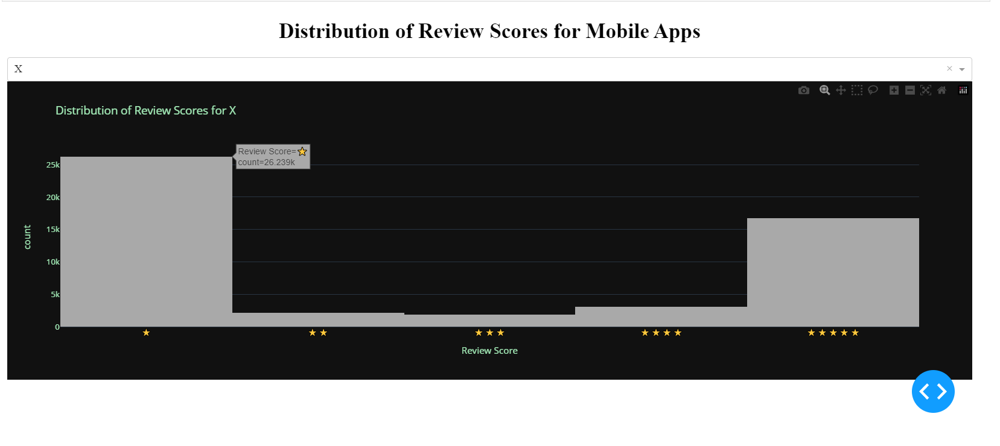
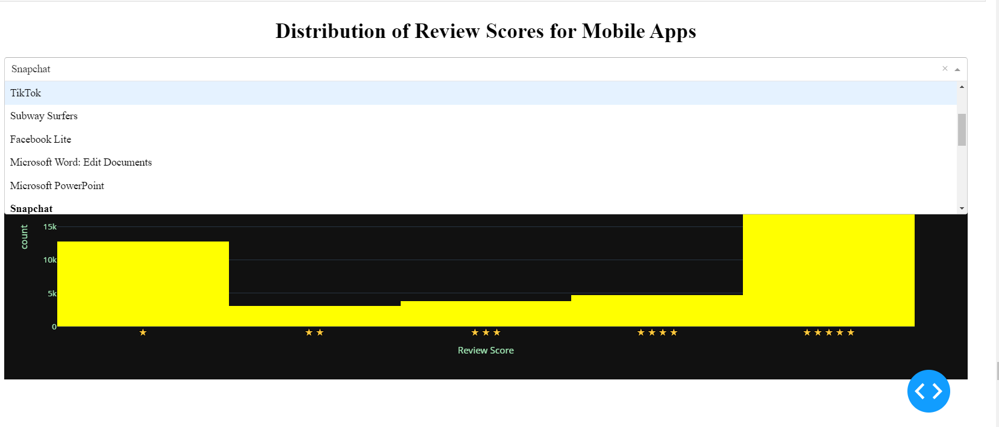

####
<h4 id="import" style="color: #5d0a70; background: #f7dcda; padding: 20px; border-radius: 20px; text-align: left; border: 5px solid #1c1c1c;">
Analyzing Top Reviews with the Most Thumbs Up
</h4>
